In [ ]:
library(Seurat)
library(SeuratDisk)
library(glue)
library(dplyr)
library(ggplot2)
library(SummarizedExperiment)
library(limma)
library(muscat)
library(purrr)
library(scales)

In [2]:
figure.path <- "~/final/results/singlecell_figures/"

### All celltypes

In [3]:
level <- 'cell_types_level_3'

In [4]:
chl.single.cell <- LoadH5Seurat("~/final/data/combined_dataset_final_v2.h5seurat")
chl.single.cell

Validating h5Seurat file

Initializing cellbender_corrected with data

Adding counts for cellbender_corrected

Adding feature-level metadata for cellbender_corrected

Adding variable feature information for cellbender_corrected

Adding miscellaneous information for cellbender_corrected

Adding reduction harmony

Adding cell embeddings for harmony

Adding feature loadings for harmony

Adding projected loadings for harmony

Adding miscellaneous information for harmony

Adding reduction pca

Adding cell embeddings for pca

Adding feature loadings for pca

Adding miscellaneous information for pca

Adding reduction umap

Adding cell embeddings for umap

Adding miscellaneous information for umap

Adding command information

Adding cell-level metadata

Adding miscellaneous information

Adding tool-specific results



An object of class Seurat 
29786 features across 308403 samples within 1 assay 
Active assay: cellbender_corrected (29786 features, 2000 variable features)
 3 dimensional reductions calculated: harmony, pca, umap

In [5]:
chl.single.cell@meta.data <- chl.single.cell@meta.data %>%
  mutate(cell_types_level_3 = 
         recode(cell_types_level_3,
                'B_cells' = 'B cells', 
                'Plasma_cells' = 'Plasma cells',
                'CD4_T_cells' = 'CD4+ T cells',
                'CD8_T_cells' = 'CD8+ T cells',
                'T_other' = 'CD4-/CD8- T cells',
                'NK_cells' = 'NK cells'
               ))

In [6]:
colors <- c(
    '#C83658FF','#FF7F0EFF','#AEC7E8FF','#96613DFF','#98DF8AFF',
    '#DDADADFF','#F8766DFF','#79AEA3FF','#2CA02CFF','#00BFC4FF',
    '#0088C5FF','#7CAE00FF','#9240C7FF','#7177E8FF','#7F7F7FFF'
)
names(colors) <- unique(chl.single.cell[[level]])[[level]]

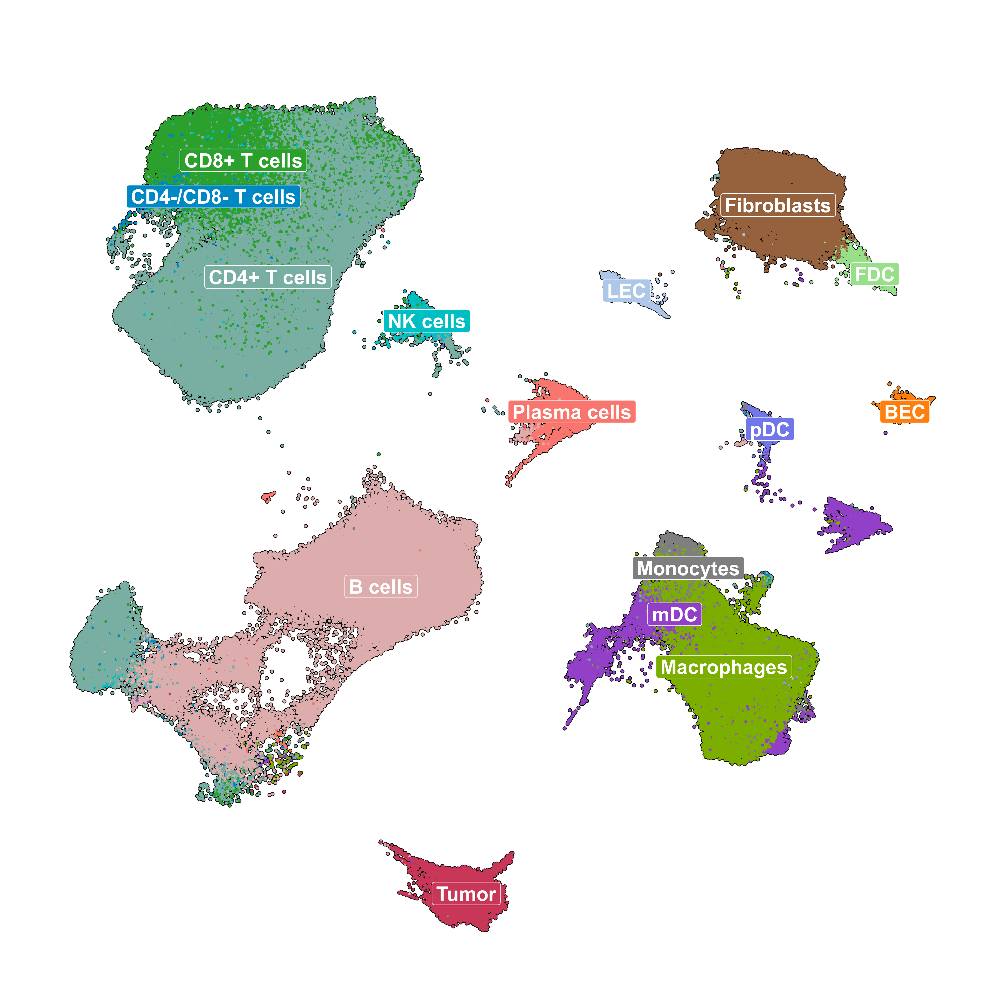

In [7]:
options(repr.plot.width=12, repr.plot.height=12, repr.plot.res=300)
p1 <- SCpubr::do_DimPlot(
    sample=chl.single.cell, 
    group.by=level, 
    colors.use=colors, 
    pt.size=.5, font.size=18,
    label=TRUE, shuffle=TRUE 
) + NoLegend()
p1$layers[[length(p1$layers)]]$aes_params$size <- 6
p1 

In [8]:
SCpubr::save_Plot(
    plot = p1, 
    figure_path = figure.path, 
    file_name = "all_cells_level3_umap", 
    width = 12, 
    height = 12, 
    output_format="all"
)

In [11]:
markers <- c(
    'PTPRC','MS4A1','PAX5','XBP1','SDC1','CD3E','CD3D','CD3G','CD4','CD8A','NCAM1','IL3RA','CD1C','CLEC9A','BATF3',
    'CD68','LYZ','C1QA','S100A8','PROX1','VWF','CCL19','COL1A1','CR1','CR2','CXCL13','TNFRSF8','CD274'
)

In [12]:
Idents(chl.single.cell) <- 'cell_types_level_3'
levels(chl.single.cell) <- rev(c(
    'B cells','Plasma cells','CD4+ T cells','CD8+ T cells','CD4-/CD8- T cells',
    'NK cells','pDC','mDC','Macrophages','Monocytes','LEC','BEC','Fibroblasts','FDC','Tumor'
))

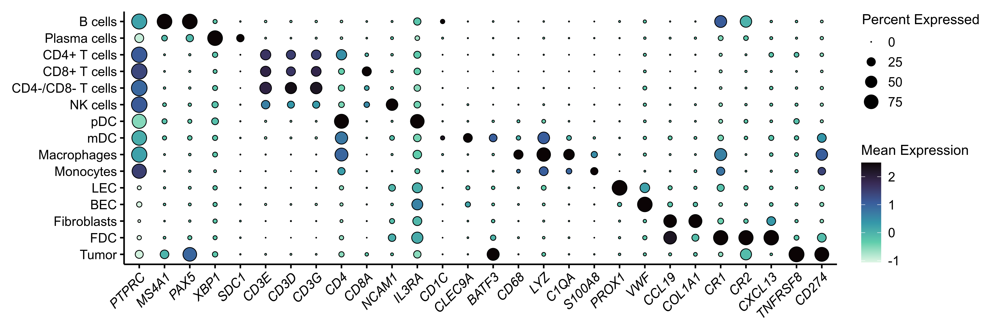

In [13]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res=300)
p <- SCpubr::do_DotPlot(
    sample = chl.single.cell, 
    features = markers,
    legend.position='right',
    legend.type='normal',
    # rotate_x_axis_labels = 90,
    use_viridis=TRUE
) + theme(axis.text.x=element_text(face = "italic"), 
          axis.text.y=element_text(face = "plain"),
          legend.text=element_text(face = "plain"),
          legend.title=element_text(face = "plain", size=12)) + 
    ggplot2::guides(fill = ggplot2::guide_colorbar(title = 'Mean Expression'))
p

In [15]:
SCpubr::save_Plot(
    plot = p, 
    figure_path = figure.path, 
    file_name = glue("all_{level}_markergenes"), 
    width = 12, 
    height = 4, 
    output_format="all"
)

### B Cells

In [16]:
level <- 'cell_types_level_4'
ctype <- 'B_cells'

In [17]:
chl.single.cell <- LoadH5Seurat(glue("~/final/data/combined_{ctype}_fine.h5seurat"))
chl.single.cell

Validating h5Seurat file

Initializing cellbender_corrected with data

Adding counts for cellbender_corrected

Adding feature-level metadata for cellbender_corrected

Adding variable feature information for cellbender_corrected

Adding miscellaneous information for cellbender_corrected

Adding reduction harmony

Adding cell embeddings for harmony

Adding feature loadings for harmony

Adding projected loadings for harmony

Adding miscellaneous information for harmony

Adding reduction pca

Adding cell embeddings for pca

Adding feature loadings for pca

Adding miscellaneous information for pca

Adding reduction umap

Adding cell embeddings for umap

Adding miscellaneous information for umap

Adding command information

Adding cell-level metadata

Adding miscellaneous information

Adding tool-specific results



An object of class Seurat 
29786 features across 67311 samples within 1 assay 
Active assay: cellbender_corrected (29786 features, 2000 variable features)
 3 dimensional reductions calculated: harmony, pca, umap

In [18]:
chl.single.cell@meta.data <- chl.single.cell@meta.data %>%
  mutate(cell_types_level_4 = 
         recode(cell_types_level_4,
                'B_GC_cycling' = 'Cycling GC B cells', 
                'B_memory' = 'Memory B cells',
                'Plasma_cells' = 'Plasma cells',
                'B_naive' = 'Naive B cells',
                'B_GC' = 'GC B cells'
               ))

In [19]:
colors <- c('#C83658FF','#9240C7FF','#F8766DFF','#7CAE00FF','#00BFC4FF','#0088C5FF')
names(colors) <- unique(chl.single.cell[[level]])[[level]]

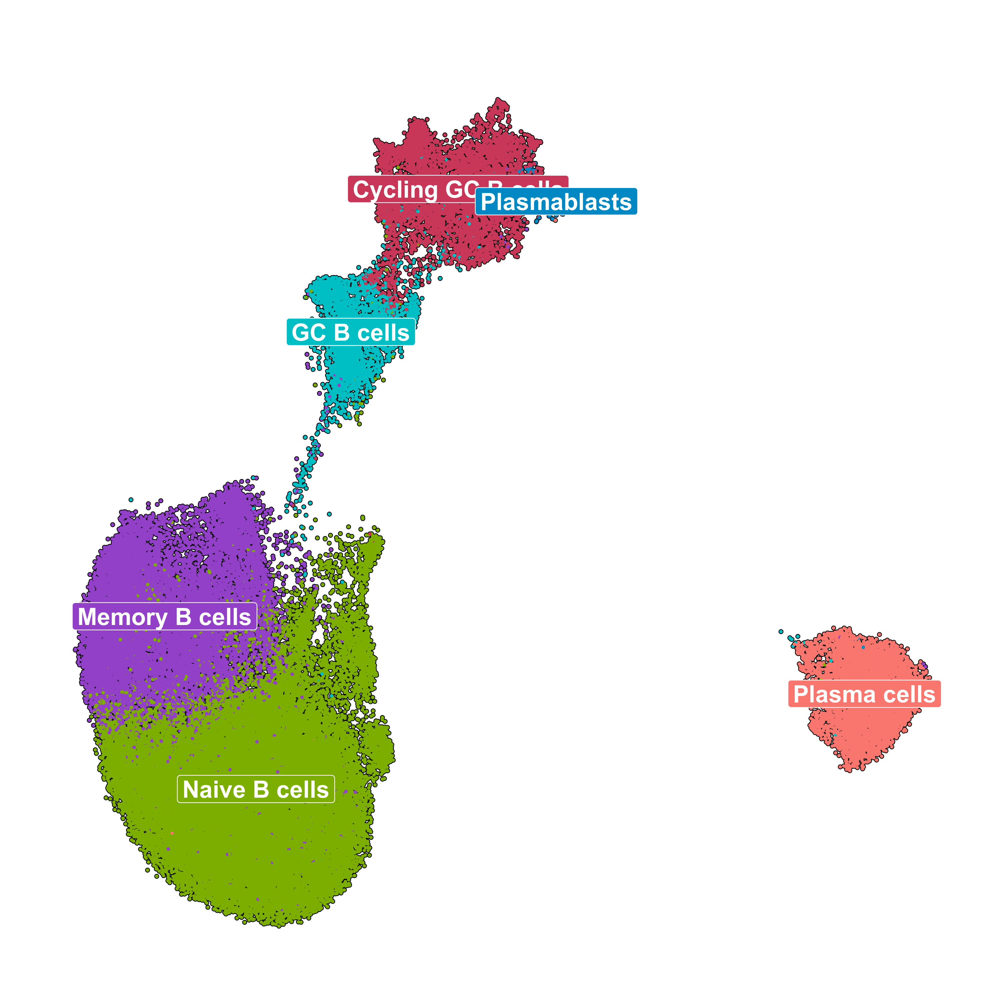

In [20]:
options(repr.plot.width=10, repr.plot.height=10, repr.plot.res=300)
p1 <- SCpubr::do_DimPlot(
    sample=chl.single.cell, 
    group.by=level, 
    colors.use=colors, 
    pt.size=.5, 
    label=TRUE, shuffle=TRUE 
) + NoLegend()
p1$layers[[length(p1$layers)]]$aes_params$size <- 6
p1 

In [21]:
SCpubr::save_Plot(
    plot = p1, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_umap"), 
    width = 10, 
    height = 10, 
    output_format="all"
)

In [22]:
markers <- c('PAX5','MS4A1','CD79A','CD27','IGHM','IGHD','TCL1A','MME','BCL6','BCL2','MKI67','TNFRSF13B','XBP1','SDC1','CD38')

In [23]:
Idents(chl.single.cell) <- 'cell_types_level_4'
levels(chl.single.cell) <- rev(c(
    'Naive B cells','GC B cells','Cycling GC B cells','Memory B cells','Plasmablasts','Plasma cells'
))

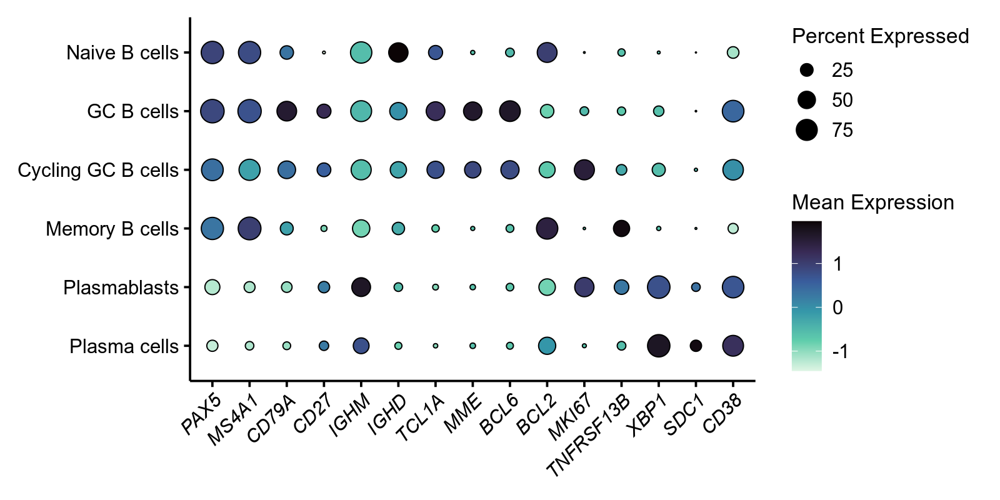

In [24]:
options(repr.plot.width=8, repr.plot.height=4, repr.plot.res=200)
p <- SCpubr::do_DotPlot(
    sample = chl.single.cell, 
    features = markers,
    legend.position='right',
    legend.type='normal',
    # rotate_x_axis_labels = 90,
    use_viridis=TRUE
) + theme(axis.text.x=element_text(face = "italic"), 
          axis.text.y=element_text(face = "plain"),
          legend.text=element_text(face = "plain"),
          legend.title=element_text(face = "plain", size=12)) + 
    ggplot2::guides(fill = ggplot2::guide_colorbar(title = 'Mean Expression'))
p

In [25]:
SCpubr::save_Plot(
    plot = p, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_markergenes"), 
    width = 8, 
    height = 4, 
    output_format="all"
)

### T Cells

In [26]:
level <- 'cell_types_level_4'
ctype <- 'T_cells'

In [27]:
chl.single.cell <- LoadH5Seurat(glue("~/final/data/combined_{ctype}_fine.h5seurat"))
chl.single.cell

Validating h5Seurat file

Initializing cellbender_corrected with data

Adding counts for cellbender_corrected

Adding feature-level metadata for cellbender_corrected

Adding variable feature information for cellbender_corrected

Adding miscellaneous information for cellbender_corrected

Adding reduction harmony

Adding cell embeddings for harmony

Adding feature loadings for harmony

Adding projected loadings for harmony

Adding miscellaneous information for harmony

Adding reduction pca

Adding cell embeddings for pca

Adding feature loadings for pca

Adding miscellaneous information for pca

Adding reduction umap

Adding cell embeddings for umap

Adding miscellaneous information for umap

Adding command information

Adding cell-level metadata

Adding miscellaneous information

Adding tool-specific results



An object of class Seurat 
29786 features across 167305 samples within 1 assay 
Active assay: cellbender_corrected (29786 features, 2000 variable features)
 3 dimensional reductions calculated: harmony, pca, umap

In [28]:
chl.single.cell@meta.data <- chl.single.cell@meta.data %>%
  mutate(cell_types_level_4 = 
         recode(cell_types_level_4,
                'CD4_T_naive' = 'Naive CD4+ T cells', 
                'Regulatory_T_cells' = 'Regulatory T cells',
                'Follicular_helper_T_cells' = 'Follicular helper T cells',
                'CD8_T_naive' = 'Naive CD8+ T cells',
                'CD8_T_effector' = 'Effector CD8+ T cells',
                'MAIT_cells' = 'MAIT cells',
                'DN_cytotoxic_T_cells' = 'CD4-/CD8- cytotoxic T cells',
                'NK_cells' = 'NK cells',
                'T_cycling' = 'Cycling T cells'
               ))

In [29]:
colors <- c('#C83658FF','#9240C7FF','#F8766DFF','#7CAE00FF','#00BFC4FF','#0088C5FF', 
            '#7F7F7FFF','#79AEA3FF','#DDADADFF','#98DF8AFF')

names(colors) <- unique(chl.single.cell[[level]])[[level]]

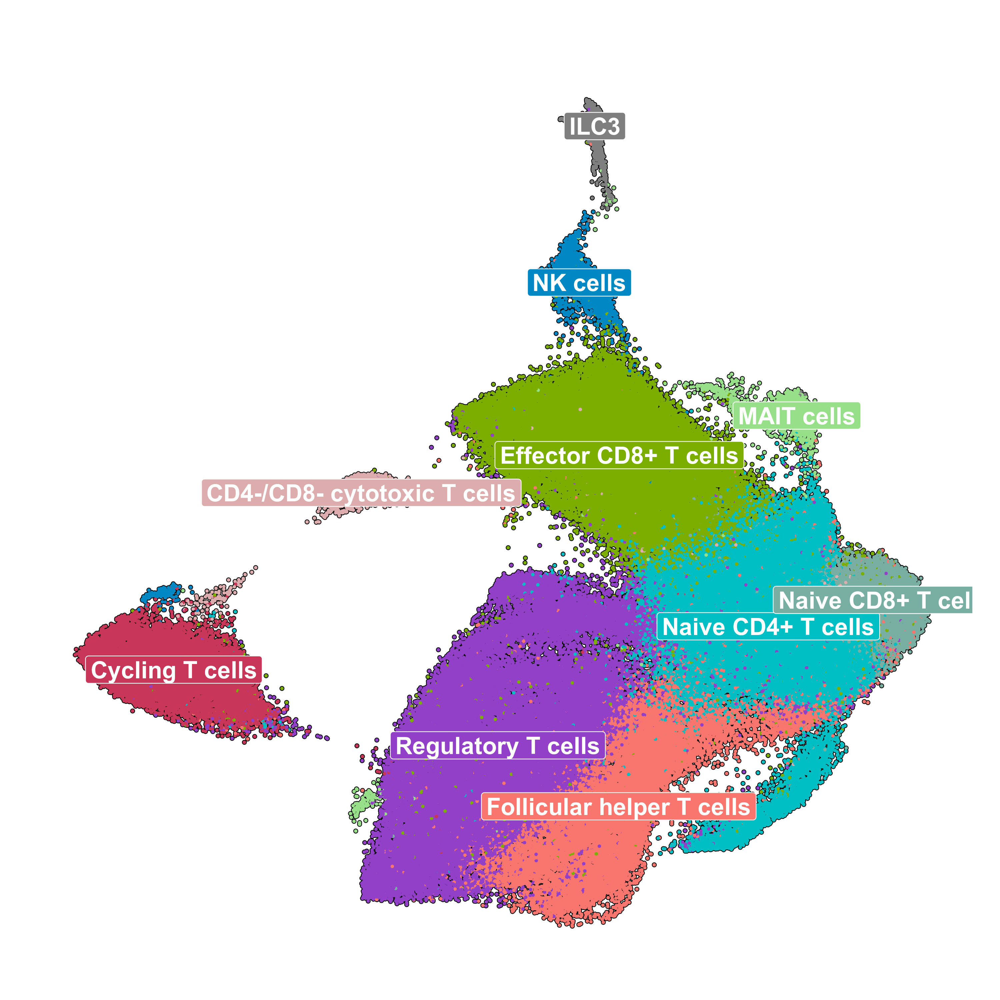

In [30]:
options(repr.plot.width=10, repr.plot.height=10, repr.plot.res=300)
p1 <- SCpubr::do_DimPlot(
    sample=chl.single.cell, 
    group.by=level, 
    colors.use=colors, 
    pt.size=.5, 
    label=TRUE, shuffle=TRUE 
) + NoLegend()
p1$layers[[length(p1$layers)]]$aes_params$size <- 6
p1 

In [31]:
SCpubr::save_Plot(
    plot = p1, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_umap"), 
    width = 10, 
    height = 10, 
    output_format="all"
)

In [32]:
markers <- c(
    'CD3D','CD3E','CD3G','CD4','CD8A','CD8B','SELL','CCR7','FOXP3','CTLA4','BCL6','PDCD1',
    'GZMK','GZMB','GZMH','GNLY','PRF1','SLC4A10','NCAM1','PCDH9','KIT','LST1','MKI67'
)

In [33]:
Idents(chl.single.cell) <- 'cell_types_level_4'
levels(chl.single.cell) <- rev(c(
    'Naive CD4+ T cells','Regulatory T cells','Follicular helper T cells','Naive CD8+ T cells',
    'Effector CD8+ T cells','MAIT cells','CD4-/CD8- cytotoxic T cells','ILC3','NK cells','Cycling T cells'
))

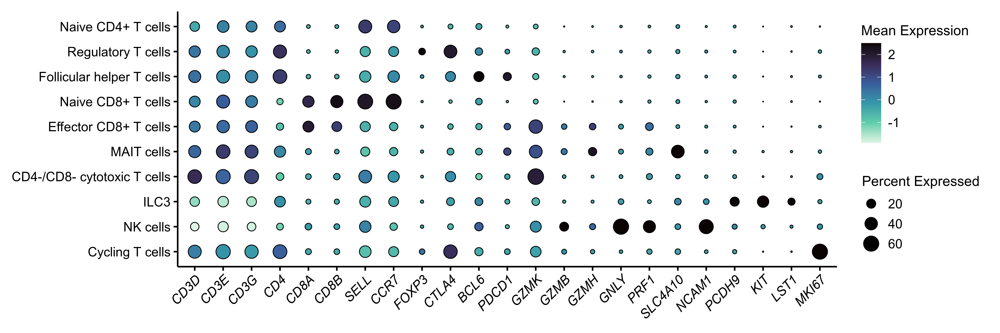

In [34]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res=300)
p <- SCpubr::do_DotPlot(
    sample = chl.single.cell, 
    features = markers,
    legend.position='right',
    legend.type='normal',
    # rotate_x_axis_labels = 90,
    use_viridis=TRUE
) + theme(axis.text.x=element_text(face = "italic"), 
          axis.text.y=element_text(face = "plain"),
          legend.text=element_text(face = "plain"),
          legend.title=element_text(face = "plain", size=12)) + 
    ggplot2::guides(fill = ggplot2::guide_colorbar(title = 'Mean Expression'))
p

In [35]:
SCpubr::save_Plot(
    plot = p, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_markergenes"), 
    width = 12, 
    height = 4, 
    output_format="all"
)

### Stromal Cells

In [36]:
level <- 'cell_types_level_4'
ctype <- 'stromal'

In [37]:
chl.single.cell <- LoadH5Seurat(glue("~/final/data/combined_{ctype}_fine.h5seurat"))
chl.single.cell

Validating h5Seurat file

Initializing cellbender_corrected with data

Adding counts for cellbender_corrected

Adding feature-level metadata for cellbender_corrected

Adding variable feature information for cellbender_corrected

Adding miscellaneous information for cellbender_corrected

Adding reduction harmony

Adding cell embeddings for harmony

Adding feature loadings for harmony

Adding projected loadings for harmony

Adding miscellaneous information for harmony

Adding reduction pca

Adding cell embeddings for pca

Adding feature loadings for pca

Adding miscellaneous information for pca

Adding reduction umap

Adding cell embeddings for umap

Adding miscellaneous information for umap

Adding command information

Adding cell-level metadata

Adding miscellaneous information

Adding tool-specific results



An object of class Seurat 
29786 features across 23772 samples within 1 assay 
Active assay: cellbender_corrected (29786 features, 2000 variable features)
 3 dimensional reductions calculated: harmony, pca, umap

In [38]:
chl.single.cell@meta.data <- chl.single.cell@meta.data %>%
  mutate(cell_types_level_4 = 
         recode(cell_types_level_4,
                'FRC' = 'Fibroblastic reticular cells', 
                'LEC_cycling' = 'Cycling LECs',
                'LEC' = 'Lymphatic endothelial cells',
                'FRC_cycling' = 'Cycling FRCs',
                'BEC_arterial' = 'Blood endothelial cells - arterial',
                'BEC_venous' = 'Blood endothelial cells - venous',
                'FDC' = 'Follicular dendritic cells',
                'Pericyte' = 'Pericytes'
               ))

In [39]:
colors <- c('#C83658FF','#9240C7FF','#F8766DFF','#7CAE00FF','#00BFC4FF','#0088C5FF', 
            '#7F7F7FFF','#79AEA3FF','#DDADADFF','#98DF8AFF')

names(colors) <- unique(chl.single.cell[[level]])[[level]]

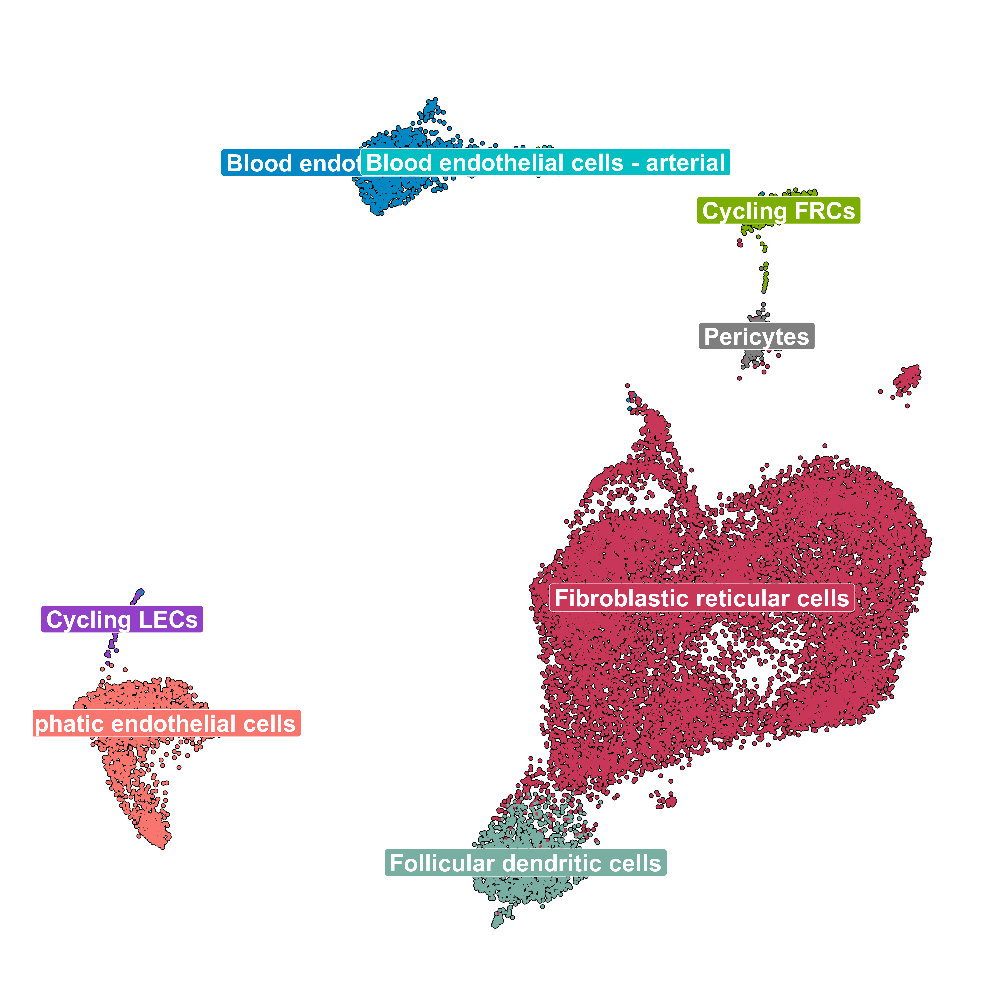

In [40]:
options(repr.plot.width=10, repr.plot.height=10, repr.plot.res=300)
p1 <- SCpubr::do_DimPlot(
    sample=chl.single.cell, 
    group.by=level, 
    colors.use=colors, 
    pt.size=.5, 
    label=TRUE, shuffle=TRUE 
) + NoLegend()
p1$layers[[length(p1$layers)]]$aes_params$size <- 6
p1 

In [41]:
SCpubr::save_Plot(
    plot = p1, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_umap"), 
    width = 10, 
    height = 10, 
    output_format="all"
)

In [42]:
markers <- c(
    'CCL19','COL1A1','COL1A2','COL3A1','DCN','ACTA2','TNFSF13B','CR1','CR2','FDCSP','CXCL13',
    'PROX1','VWF','ACKR1','GJA5','HIGD1B','NDUFA4L2','MKI67'
)

In [43]:
Idents(chl.single.cell) <- 'cell_types_level_4'
levels(chl.single.cell) <- rev(c(
    'Fibroblastic reticular cells', 'Follicular dendritic cells', 'Cycling FRCs', 'Lymphatic endothelial cells',
    'Cycling LECs','Blood endothelial cells - venous', 'Blood endothelial cells - arterial', 'Pericytes'
))

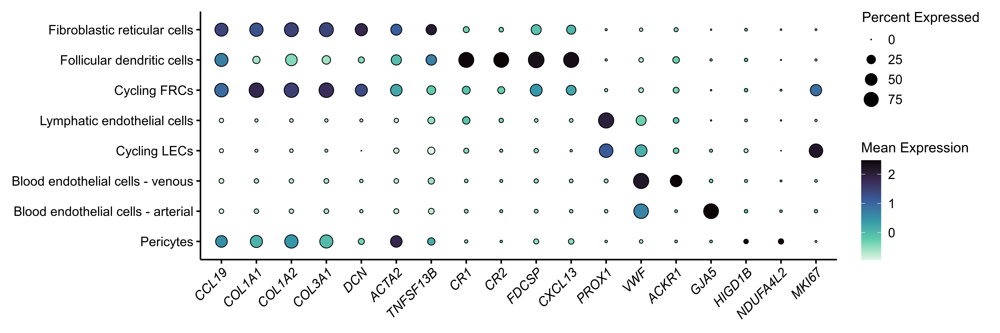

In [44]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res=300)
p <- SCpubr::do_DotPlot(
    sample = chl.single.cell, 
    features = markers,
    legend.position='right',
    legend.type='normal',
    # rotate_x_axis_labels = 90,
    use_viridis=TRUE
) + theme(axis.text.x=element_text(face = "italic"), 
          axis.text.y=element_text(face = "plain"),
          legend.text=element_text(face = "plain"),
          legend.title=element_text(face = "plain", size=12)) + 
    ggplot2::guides(fill = ggplot2::guide_colorbar(title = 'Mean Expression'))
p

In [45]:
SCpubr::save_Plot(
    plot = p, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_markergenes"), 
    width = 12, 
    height = 4, 
    output_format="all"
)

### Myeloid Cells

In [46]:
level <- 'cell_types_level_4'
ctype <- 'myeloid_cells'

In [47]:
chl.single.cell <- LoadH5Seurat(glue("~/final/data/combined_{ctype}_fine.h5seurat"))
chl.single.cell

Validating h5Seurat file

Initializing cellbender_corrected with data

Adding counts for cellbender_corrected

Adding feature-level metadata for cellbender_corrected

Adding variable feature information for cellbender_corrected

Adding miscellaneous information for cellbender_corrected

Adding reduction harmony

Adding cell embeddings for harmony

Adding feature loadings for harmony

Adding projected loadings for harmony

Adding miscellaneous information for harmony

Adding reduction pca

Adding cell embeddings for pca

Adding feature loadings for pca

Adding miscellaneous information for pca

Adding reduction umap

Adding cell embeddings for umap

Adding miscellaneous information for umap

Adding graph cellbender_corrected_nn

Adding graph cellbender_corrected_snn

Adding command information

Adding cell-level metadata

Adding miscellaneous information

Adding tool-specific results



An object of class Seurat 
29786 features across 43295 samples within 1 assay 
Active assay: cellbender_corrected (29786 features, 2000 variable features)
 3 dimensional reductions calculated: harmony, pca, umap

In [48]:
chl.single.cell@meta.data <- chl.single.cell@meta.data %>%
  mutate(cell_types_level_4 = 
         recode(cell_types_level_4,
                'DC_cycling' = 'Cycling DCs', 
                'migratory_DC' = 'Migratory DCs',
                'pDC' = 'Plasmacytoid dendritic cells'
               ))

In [49]:
colors <- c('#C83658FF','#9240C7FF','#F8766DFF','#7CAE00FF','#00BFC4FF','#0088C5FF', 
            '#7F7F7FFF','#79AEA3FF','#DDADADFF','#98DF8AFF')

names(colors) <- unique(chl.single.cell[[level]])[[level]]

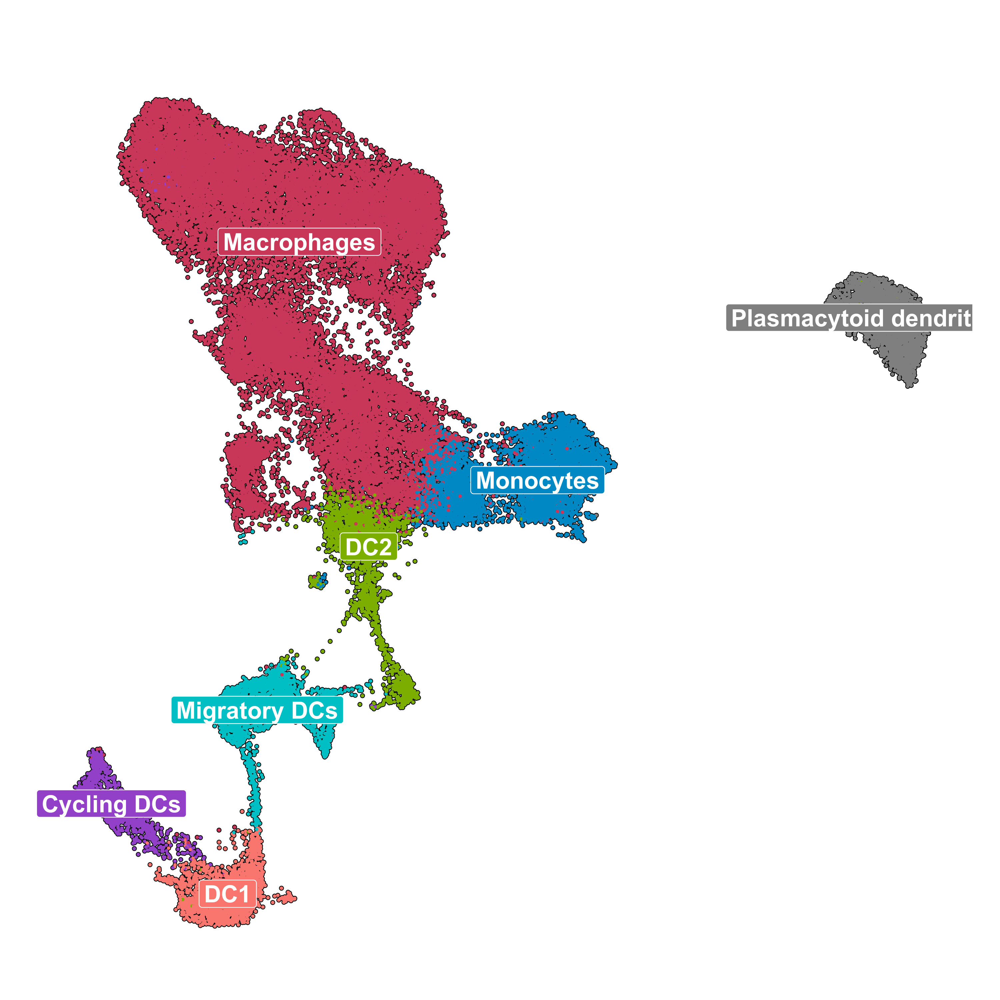

In [50]:
options(repr.plot.width=10, repr.plot.height=10, repr.plot.res=300)
p1 <- SCpubr::do_DimPlot(
    sample=chl.single.cell, 
    group.by=level, 
    colors.use=colors, 
    pt.size=.5, 
    label=TRUE, shuffle=TRUE 
) + NoLegend()
p1$layers[[length(p1$layers)]]$aes_params$size <- 6
p1 

In [51]:
SCpubr::save_Plot(
    plot = p1, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_umap"), 
    width = 10, 
    height = 10, 
    output_format="all"
)

In [52]:
markers <- c(
    'CD74','HLADRA','LYZ','CD68','C1QA','C1QB','CD68','S100A8','S100A9','CD14','FCGR3A','CLEC9A','IDO1','XCR1',
    'CLEC10A','CD1C','PKIB','FSCN1','LAMP3','CCR7','IL3RA','LILRA4','PLD4','MKI67'
)

In [53]:
Idents(chl.single.cell) <- 'cell_types_level_4'
levels(chl.single.cell) <- rev(c(
    'Macrophages','Monocytes','DC1','DC2','Migratory DCs','Plasmacytoid dendritic cells','Cycling DCs'
))

Warning message:
“The requested features (HLADRA) could not be found:
    - Not matching any gene name (rownames of the provided object).
    - Not matching any metadata column (in sample@meta.data).
    - Not part of the dimension names in any of the following reductions: harmony, pca, umap.

”
Warning message:
“Found duplicated features (CD68). Excluding them from the analysis.”


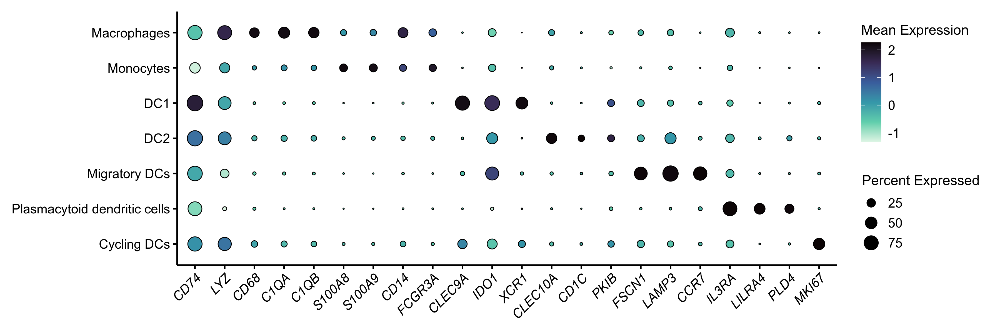

In [54]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res=300)
p <- SCpubr::do_DotPlot(
    sample = chl.single.cell, 
    features = markers,
    legend.position='right',
    legend.type='normal',
    # rotate_x_axis_labels = 90,
    use_viridis=TRUE
) + theme(axis.text.x=element_text(face = "italic"), 
          axis.text.y=element_text(face = "plain"),
          legend.text=element_text(face = "plain"),
          legend.title=element_text(face = "plain", size=12)) + 
    ggplot2::guides(fill = ggplot2::guide_colorbar(title = 'Mean Expression'))
p

In [55]:
SCpubr::save_Plot(
    plot = p, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_markergenes"),
    width = 12, 
    height = 4, 
    output_format="all"
)

In [56]:
sessionInfo()

R version 4.1.2 (2021-11-01)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Debian GNU/Linux 11 (bullseye)

Matrix products: default
BLAS/LAPACK: /home/dchafamo/anaconda3/envs/seurat_imaging/lib/libopenblasp-r0.3.20.so

locale:
 [1] LC_CTYPE=C.UTF-8       LC_NUMERIC=C           LC_TIME=C.UTF-8       
 [4] LC_COLLATE=C.UTF-8     LC_MONETARY=C.UTF-8    LC_MESSAGES=C.UTF-8   
 [7] LC_PAPER=C.UTF-8       LC_NAME=C              LC_ADDRESS=C          
[10] LC_TELEPHONE=C         LC_MEASUREMENT=C.UTF-8 LC_IDENTIFICATION=C   

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] scales_1.2.1                purrr_0.3.5                
 [3] muscat_1.8.2                limma_3.50.3               
 [5] SummarizedExperiment_1.24.0 Biobase_2.54.0             
 [7] GenomicRanges_1.46.1        GenomeInfoDb_1.30.1        
 [9] IRanges_2.28.0              S4Vectors_0.32.4           
[11] BiocGenerics_0.40